<a href="https://colab.research.google.com/github/Parth0124/Computer-Vision/blob/main/face_detection_cascade.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import cv2

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg')

In [5]:
image

array([[[ 91, 103, 107],
        [102, 114, 118],
        [ 92, 107, 110],
        ...,
        [187, 192, 193],
        [186, 191, 192],
        [185, 190, 191]],

       [[ 93, 105, 109],
        [ 97, 109, 113],
        [ 95, 110, 113],
        ...,
        [187, 192, 193],
        [186, 191, 192],
        [185, 190, 191]],

       [[ 96, 111, 114],
        [ 96, 111, 114],
        [102, 117, 120],
        ...,
        [186, 191, 192],
        [185, 190, 191],
        [184, 189, 190]],

       ...,

       [[ 48,  43,  40],
        [ 46,  41,  38],
        [ 44,  39,  36],
        ...,
        [251, 248, 244],
        [252, 247, 244],
        [251, 246, 243]],

       [[ 55,  49,  44],
        [ 53,  47,  42],
        [ 49,  43,  38],
        ...,
        [251, 248, 244],
        [252, 247, 244],
        [252, 247, 244]],

       [[ 56,  50,  45],
        [ 54,  48,  43],
        [ 50,  44,  39],
        ...,
        [252, 249, 245],
        [253, 248, 245],
        [253, 248, 245]]

In [6]:
image.shape

(1280, 1920, 3)

In [7]:
from google.colab.patches import cv2_imshow

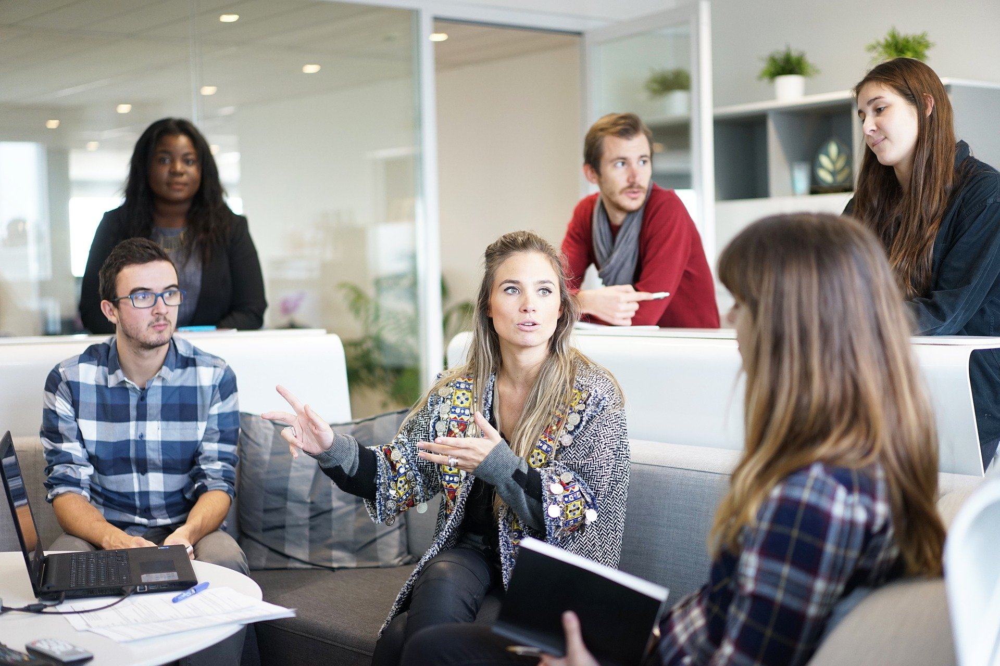

In [8]:
#can use cv2.imshow() method to view the image but google colab doesn't allow so need to use the google_colab_patches cv2_imshow.
cv2_imshow(image)

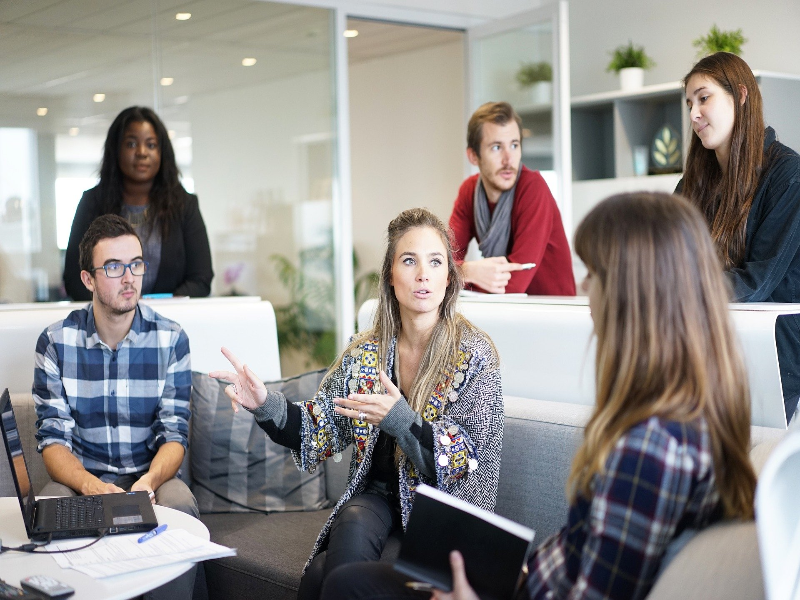

In [9]:
#Resize in iamge
image = cv2.resize(image,(800,600))
image.shape
cv2_imshow(image)

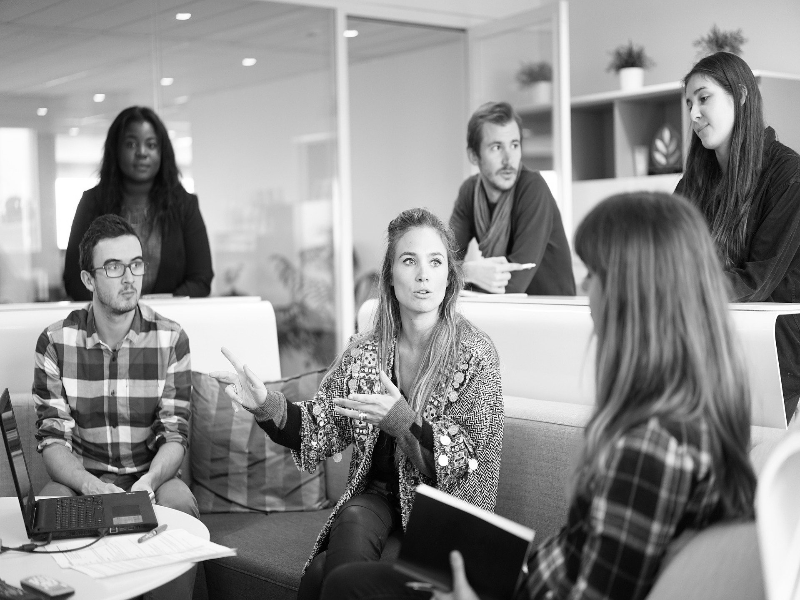

In [10]:
#Convert to greyscale image
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

In [11]:
image_gray.shape

(600, 800)

In [12]:
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')

In [13]:
detections = face_detector.detectMultiScale(image_gray)

In [14]:
detections

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

In [15]:
len(detections)

6

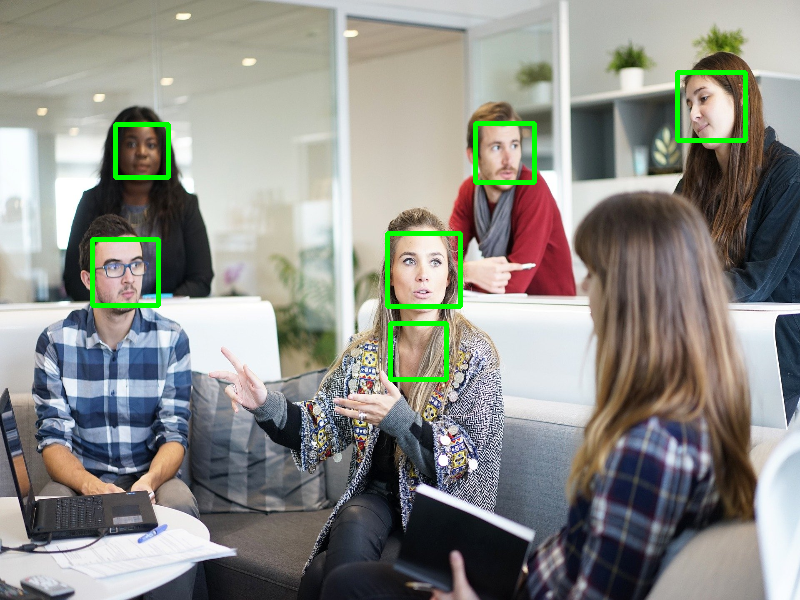

In [16]:
for (x,y,w,h) in detections:
  cv2.rectangle(image,(x,y), (x+w,y+h), (0,255,0),3)
cv2_imshow(image)

In [17]:
detections_scaleFactor = face_detector.detectMultiScale(image_gray, scaleFactor=1.09)

In [18]:
detections_scaleFactor

array([[678,  74,  65,  65],
       [113, 122,  56,  56],
       [475, 122,  60,  60],
       [386, 232,  74,  74],
       [ 90, 238,  69,  69]], dtype=int32)

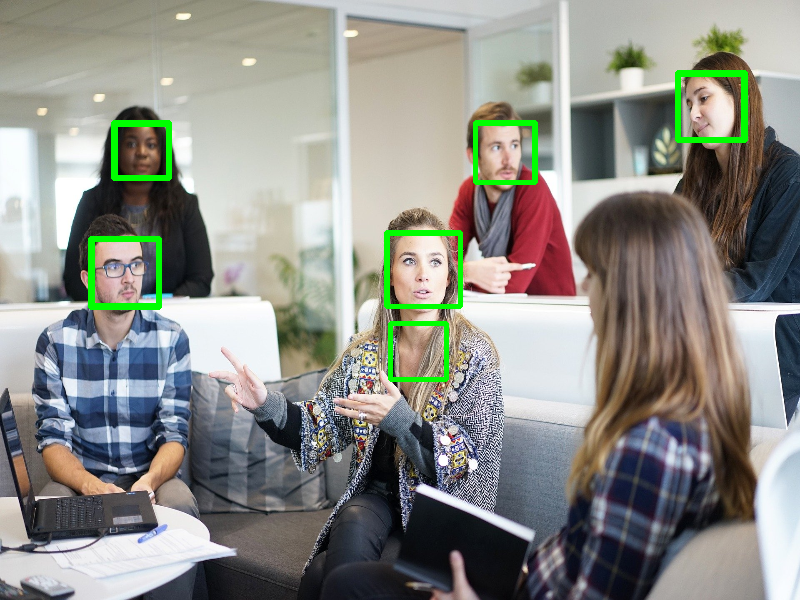

In [19]:
for (x,y,w,h) in detections_scaleFactor:
  cv2.rectangle(image,(x,y), (x+w,y+h), (0,255,0),3)
cv2_imshow(image)

In [20]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people2.jpg')

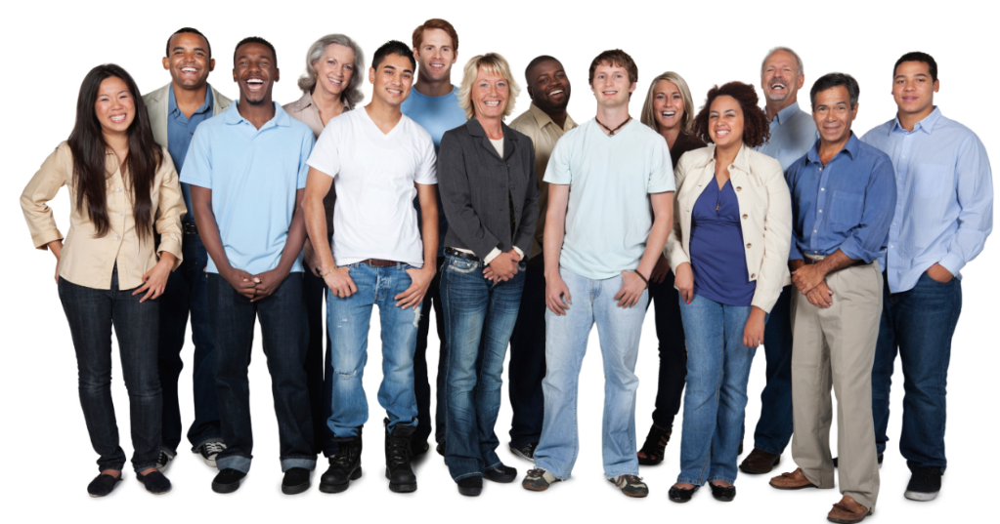

In [21]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.2, minNeighbors=7, minSize=(20,20), maxSize=(40,40))
for(x,y,w,h) in detections:
  print(w,h)
  cv2.rectangle(image,(x,y), (x+w,y+h), (0,255,0),3)
cv2_imshow(image)

In [22]:
eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Computer Vision Masterclass/Cascades/haarcascade_eye.xml')

38 38
36 36
27 27
36 36
25 25
41 41
40 40
27 27
26 26
79 79


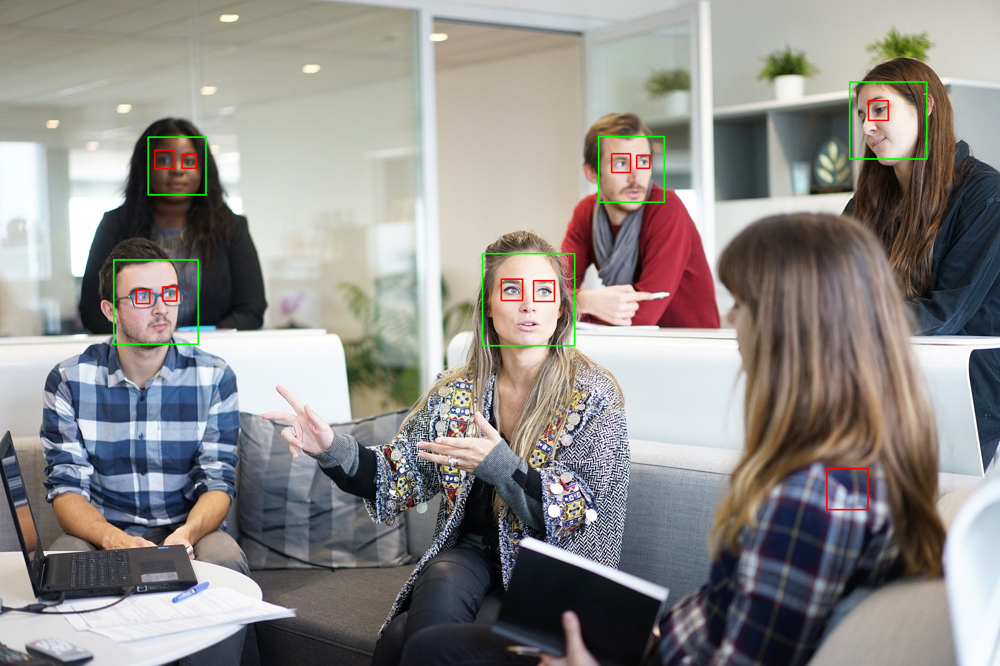

In [28]:
image = cv2.imread('/content/drive/MyDrive/Computer Vision Masterclass/Images/people1.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

face_detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.32)
for(x,y,w,h) in face_detections:
  cv2.rectangle(image,(x,y), (x+w,y+h), (0,255,0),2)

eye_detections = eye_detector.detectMultiScale(image_gray, scaleFactor=1.06, minNeighbors=10)
for(x,y,w,h) in eye_detections:
  print(w,h)
  cv2.rectangle(image,(x,y), (x+w,y+h), (0,0,255),2)
cv2_imshow(image)